* A common operation for image processing is blurring or smoothing an image.
* Smoothing an image can help get rid of noise, or help an application focus of genral details.
* There are many methods of blurring and smoothing.
* Often blurring or smoothing is combined with edge detection.
* Edge detection algorithm detect too many edges when shown a high reslution image without any blurring
* Often blurring or smoothing is combined with edge detection.

# Methods we will be exploring,
### <center> Gamma Correction <center/>
* Gamma correction can be applied to an image to make it appear brighter or darker depending on the Gamma value

### <center> Kernel Based Filters <center/>
* Kernels can be applied over an image to producea variety of effects.
* The best way to explain this is through an interactive visualization [ https://setosa.io/ev/image-kernels/ ].

In [12]:
import matplotlib.pyplot as plt
import cv2 
import numpy as np
%matplotlib inline

In [13]:
# The function below loads image 
def load_img():
    img = cv2.imread('../DATA/bricks.jpg').astype(np.float32) / 255 # img must be converted to float to apply gamma correction
# astype ---> makes copy of an array and changes to user specified type.
# dividing by 255 is just to make the pixel value between 0 and 1
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [14]:
# The function below displays image 
def display_img(img):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img)

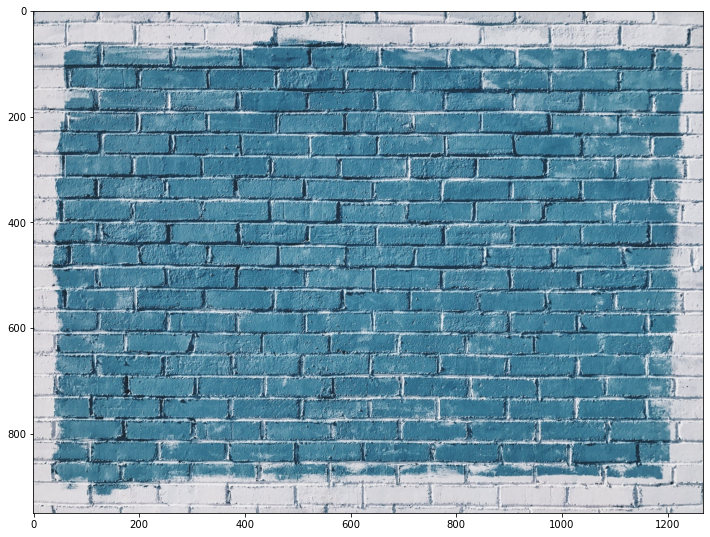

In [15]:
i = load_img()
img = display_img(i)
img

## Let's try gamma correction
#### For gamma correction we need to set the gamma value, 
* The greater the value will be the darker the image you will have.
* The lesser the value will be the brighter the image you will have.

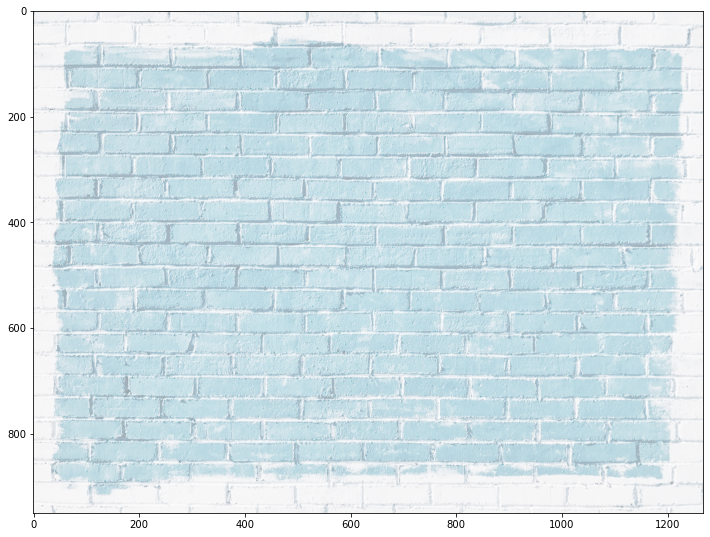

In [16]:
gamma = 1/5
blur_img = np.power(i,gamma)
display_img(blur_img)

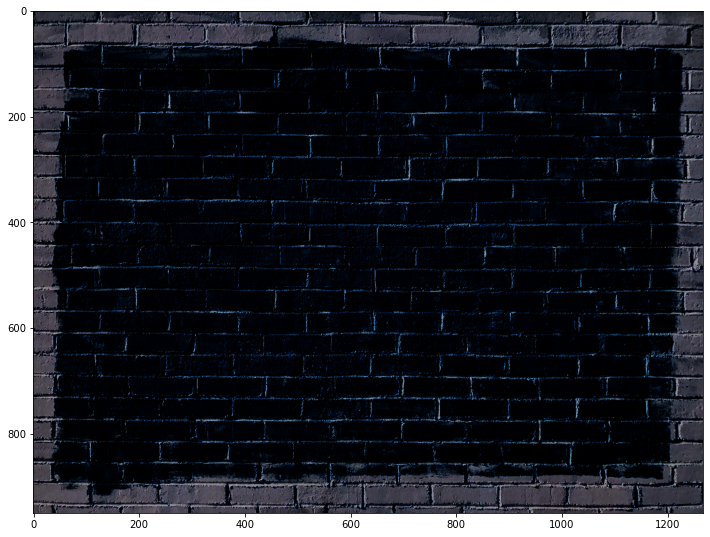

In [17]:
gamma = 8
blur_img = np.power(i,gamma)
display_img(blur_img)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


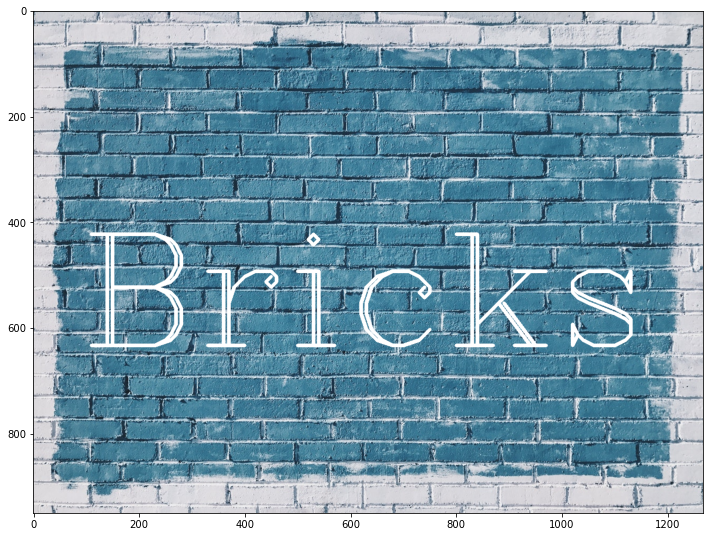

In [18]:
# now we will write some text on the picture so that blur will be visible.
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
display_img(img)
# in the picture we can see the spaces between the fonts

## For Blurring 
* First, we need to create kernel of any size(as we have seen 3x3 kernel on image kernel website) and then assign values to it.
* Second, we will use filter2D function.

## CV2 :: Filter2D 

* filter2D(src, ddepth, kernel[, dst[, anchor[, delta[, borderType]]]])
* We only need to work with three parameters src,ddepth and kernel.
* Src is the source image
* Ddepth means desired depth of the destination image
* Kernel is the one we would create using np.ones , the bigger the kernel the greater the blur effect you would see.

## <center> More about Ddepth

### Ddepth
ddepth means desired depth of the destination image

* It has information about what kinds of data stored in an image, and that can be unsigned char (CV_8U), signed char (CV_8S), unsigned short (CV_16U), and so on...
* If you use -1, the result (destination) image will have the same depth as the input (source) image.
## <center> About Type

### Type

* As for type, the type has information combined from 2 values: image depth + the number of channels.
* It can be for example CV_8UC1 (which is equal to CV_8U), CV_8UC2, CV_8UC3, CV_8SC1 (which is equal to CV_8S) etc.

In [20]:
kernel = np.ones((4,4),np.float32)/16
kernel 
# dividing by 20 makes every value .05(by this we can see color channels between 0 and 1).

array([[0.0625, 0.0625, 0.0625, 0.0625],
       [0.0625, 0.0625, 0.0625, 0.0625],
       [0.0625, 0.0625, 0.0625, 0.0625],
       [0.0625, 0.0625, 0.0625, 0.0625]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


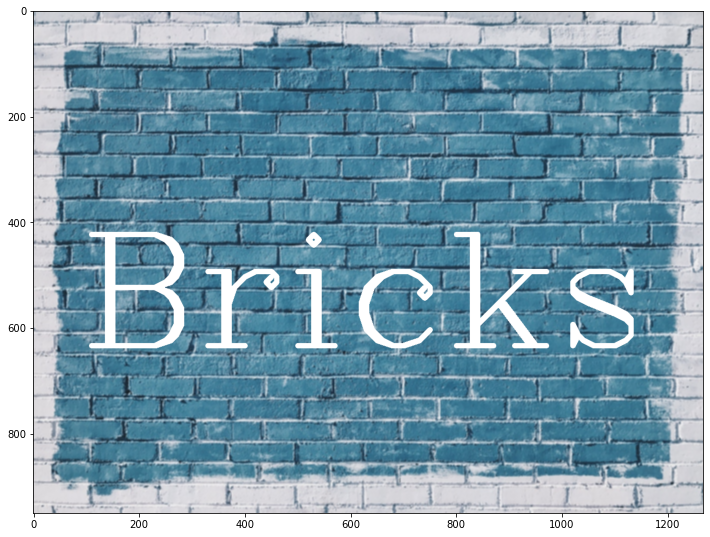

In [21]:
result = cv2.filter2D(img,-1,kernel)
display_img(result)
# in the picture below we can see that the spaces between the fonts are being filled(hence blurred).

# [ https://stackoverflow.com/questions/43392956/explanation-for-ddepth-parameter-in-cv2-filter2d-opencv ]
# [ https://answers.opencv.org/question/4783/image-type-vs-image-depth/#:~:text='Depth'%20is%20type%20of%20data%20of%20your%20image.&text='Type'%20is%20combination%20of%20two,more%20information%20in%20this%20question. ]
# [ https://docs.opencv.org/2.4/modules/imgproc/doc/filtering.html?highlight=gaussianblur#filter2d ] 
# [ https://stackoverflow.com/questions/32602018/what-is-depth-in-image-processing ]
# [ https://pythonexamples.org/python-opencv-image-filter-convolution-cv2-filter2d/ ]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


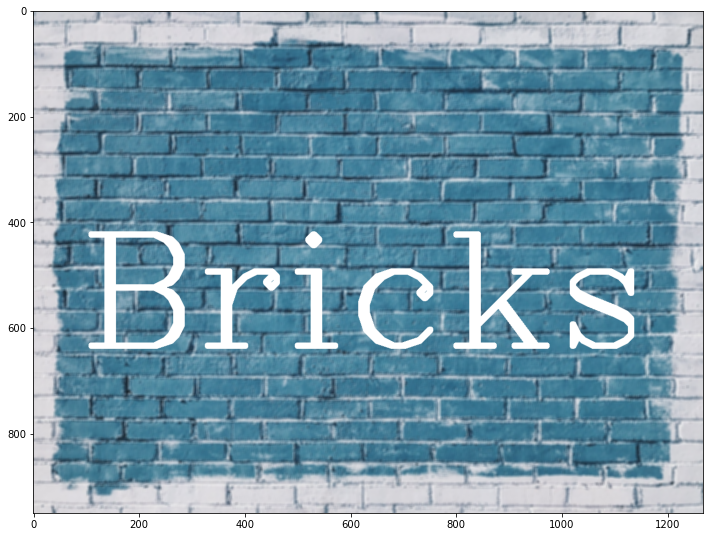

In [22]:
# lets try changing kernel shape and divide value
load_img()
kernel = np.ones((6,6),np.float32)/36
result = cv2.filter2D(img,-1,kernel)
display_img(result)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


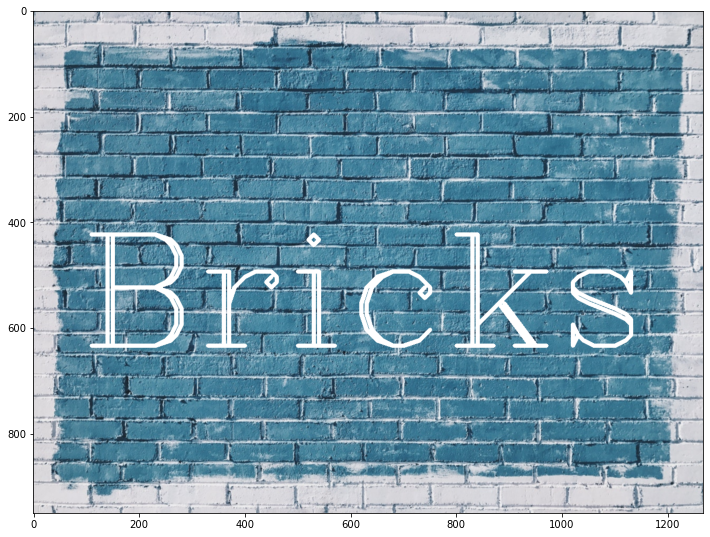

In [23]:
# lets try changing kernel shape and divide value
load_img()
kernel = np.ones((2,2),np.float32)/4
result = cv2.filter2D(img,-1,kernel)
display_img(result)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


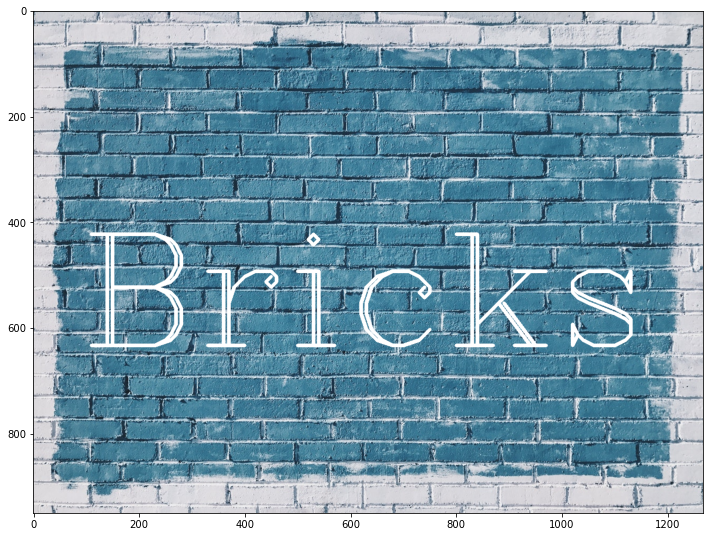

In [15]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
display_img(img)

## CV2 :: Blur
* There's actually a default blur function that uses the same kernel as we have seen on image kernel website
* blur(src, ksize[, dst[, anchor[, borderType]]])
* We just need to work with two parameters src and ksize
* Src is the source image 
* Ksize is the kernel size we want

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


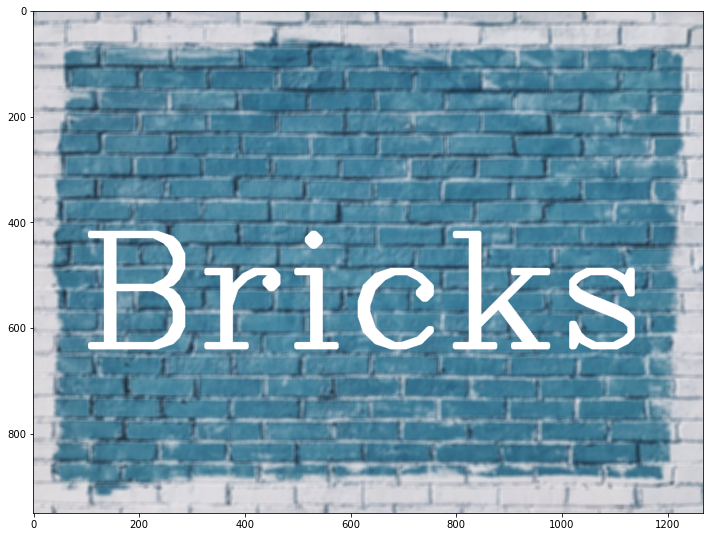

In [17]:
img_blur = cv2.blur(img,ksize=(8,8))
display_img(img_blur)

## CV2 :: Gaussian Blurring
GaussianBlur(src, ksize, sigmaX[, dst[, sigmaY[, borderType]]]) -> dst
* We just need to work with four parameters src , ksize , sigmaX and sigmaY
* Src is the source image
* Ksize is the kernel size, this must be in odd numbers (x-odd,y-odd).
* More to read here [ https://stackoverflow.com/questions/27527440/opencv-error-assertion-failed-ksize-width-for-gaussianblur ]
* SigmaX Gaussian kernel standard deviation in X direction.
* SigmaY Gaussian kernel standard deviation in Y direction.
* If sigmaY is zero, it is set to be equal to sigmaX, if both sigmas are zeros, they are computed  from ksize.width and ksize.height, respectively.
* We can see what kernel values are Gaussing Blur is using by getGaussianKernel function.
<center> <b> The role of sigma in the Gaussian filter is to control the variation around its mean value. So as the Sigma becomes larger the more variance allowed around mean and as the Sigma becomes smaller the less variance allowed around mean

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


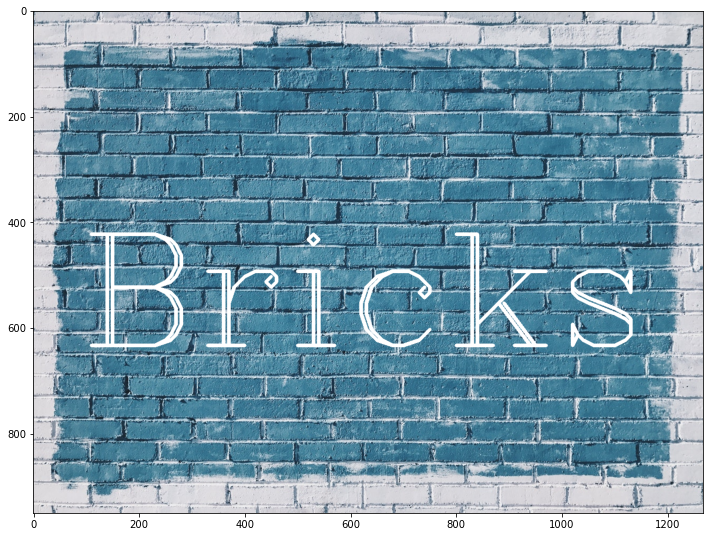

In [19]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


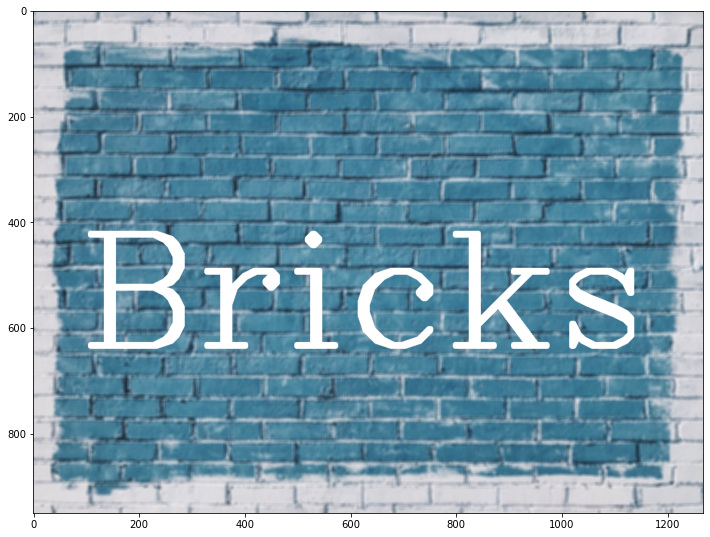

In [21]:
gaus_blur = cv2.GaussianBlur(img,(7,7),50)
display_img(gaus_blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


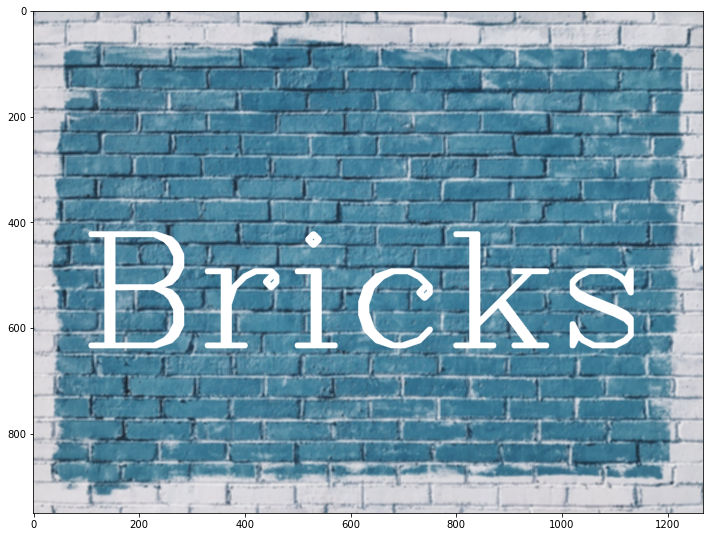

In [26]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
gaus_blur = cv2.GaussianBlur(img,(5,5),sigmaX = 50,sigmaY = 100)
display_img(gaus_blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


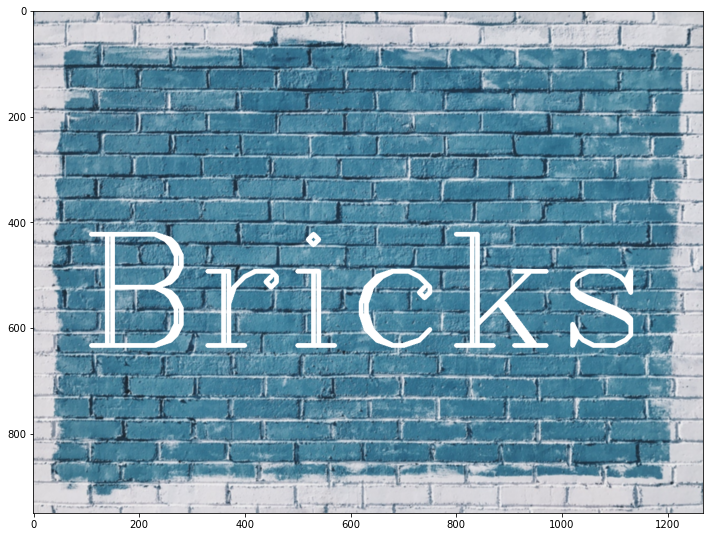

In [27]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
gaus_blur = cv2.GaussianBlur(img,(3,3),500)
display_img(gaus_blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


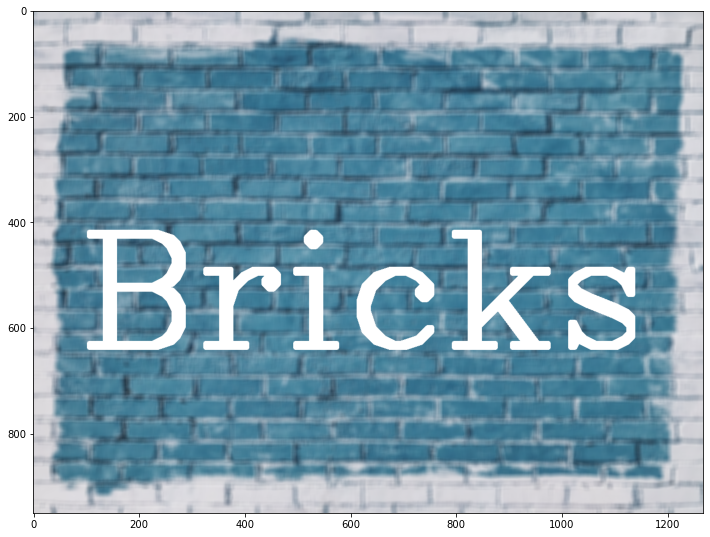

In [29]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
gaus_blur = cv2.GaussianBlur(img,(11,11),500)
display_img(gaus_blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


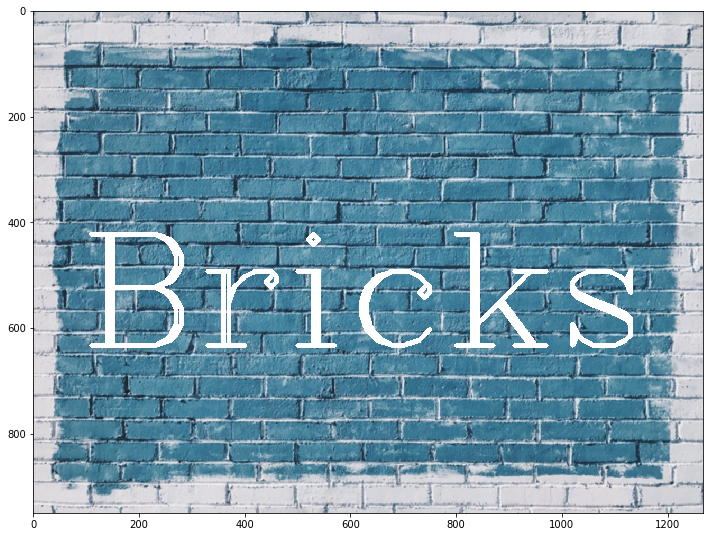

In [330]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
gaus_blur = cv2.GaussianBlur(img,(3,3),100,900)
display_img(gaus_blur)

## CV2 :: Median Blurring
* medianBlur(src, ksize[, dst]) -> dst
* We just need to work with four parameters src , ksize 
* Src is the source image7
* Ksize is the kernel size, this must be in odd numbers (x-odd,y-odd).
<center><b> Its actually tends to be really good at removing noise from an image while trying to keep certain details in check.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


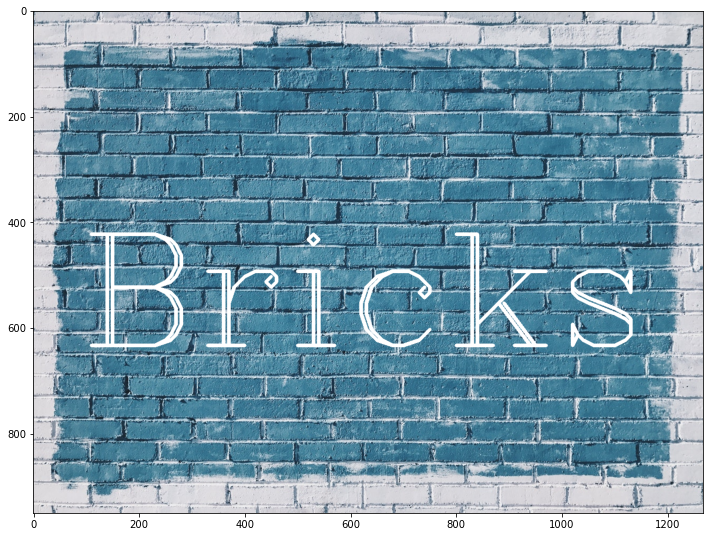

In [30]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


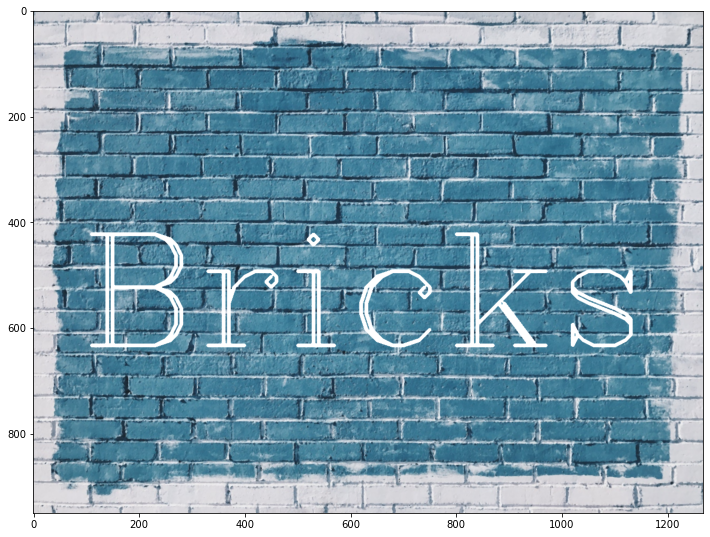

In [31]:
med_blur = cv2.medianBlur(img,3)
display_img(med_blur)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


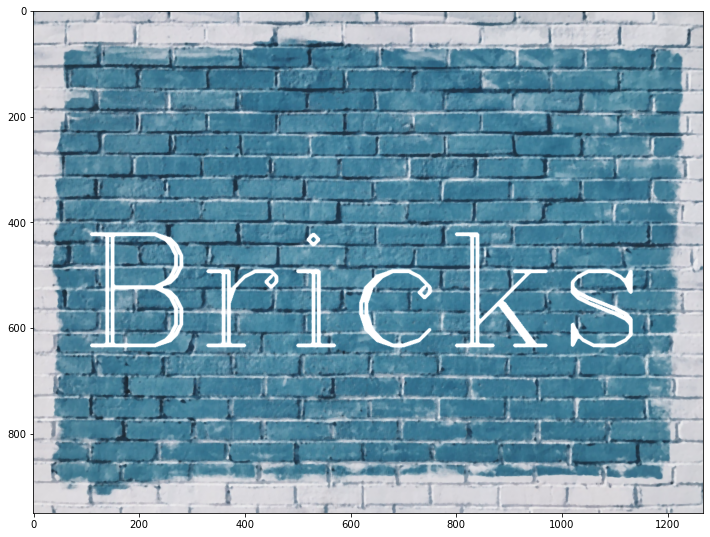

In [32]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
med_blur = cv2.medianBlur(img,5)
display_img(med_blur)
# in this image's case ksize greater than 5x5 wont work because a larger number will use a larger matrix, and take pixels
# from further away from the center, which may or may not help. Whether you want a larger or smaller kernel really depends
# on the image, but 5 is a good number to start with.

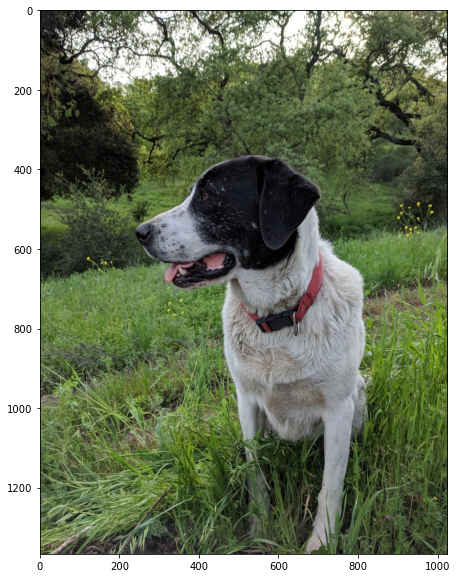

In [48]:
# Lets try using more noisey picture
img = cv2.imread('../Data/sammy.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(img) # this is not noisey picture the next one is you can see difference easily

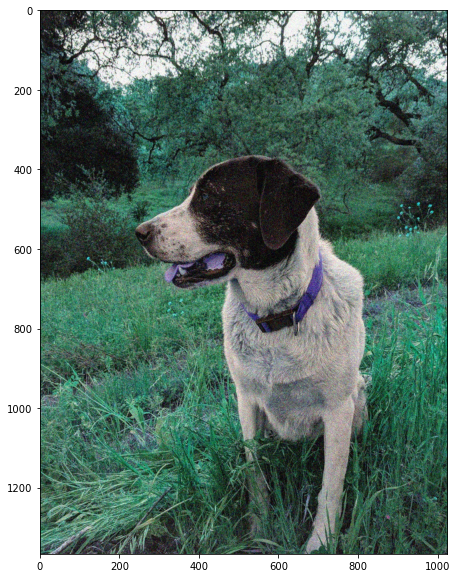

In [36]:
img = cv2.imread('../Data/sammy_noise.jpg')
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
display_img(img) # this is noisey picture
# we can add noise in any picture by just selecting random pixel and set them to randon value 

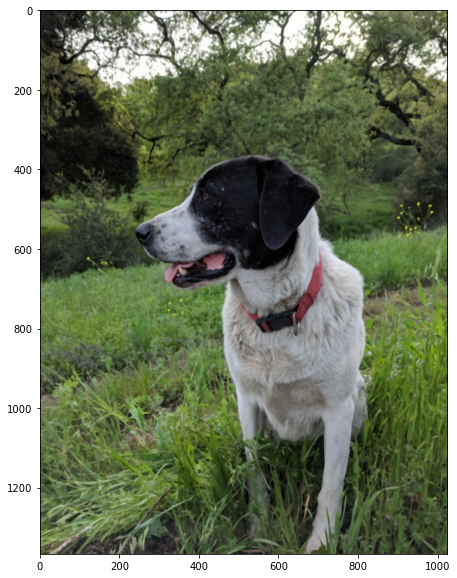

In [55]:
med_blur = cv2.medianBlur(img,5)
display_img(med_blur)

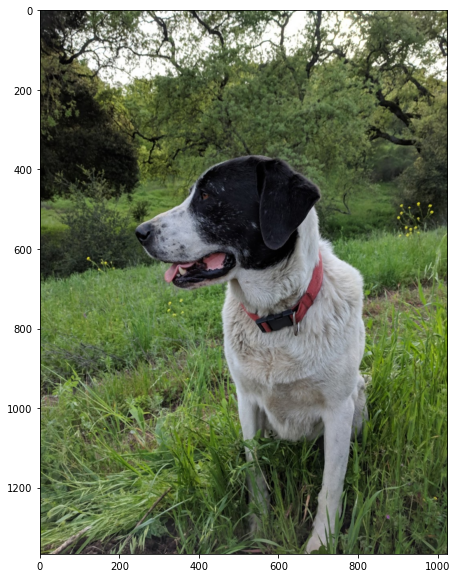

In [56]:
med_blur = cv2.medianBlur(img,3)
display_img(med_blur)

## CV2 :: Bilateral Filter
* bilateralFilter(src, d, sigmaColor, sigmaSpace[, dst[, borderType]]) -> dst
* We just need to work with four parameters src , d , sigma color and sigma space
* **Src** - The source image
* **d** - Diameter of each pixel neighborhood that is used during filtering. If it is non-positive, it is computed from sigmaSpace.
* **sigmaColor** - Filter sigma in the color space. A larger value of the parameter means that farther colors within the pixel neighborhood will be mixed together, resulting in larger areas of semi-equal color.
* **sigmaSpace**: Value of sigma in the coordinate space. The greater its value, the more further pixels will mix together, given that their colors lie within the sigmaColor range.
$$-----OR-----$$
* **sigmaSpace** - Filter sigma in the coordinate space. A larger value of the parameter means that farther pixels will influence each other as long as their colors are close enough. When d>0 , it specifies the neighborhood size regardless of sigmaSpace . Otherwise, d is proportional to sigmaSpace.
<center><b> A bilateral filter is used for smoothening images and reducing noise, while preserving edges.
<center><b> Its slow as compared to other filters
    
$$Links to learn more about Bilateral Filter ,
[ https://www.bogotobogo.com/OpenCV/opencv_3_tutorial_imgproc_gausian_median_blur_bilateral_filter_image_smoothing_B.php ]
[ https://www.geeksforgeeks.org/python-bilateral-filtering/ ] 
$$

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


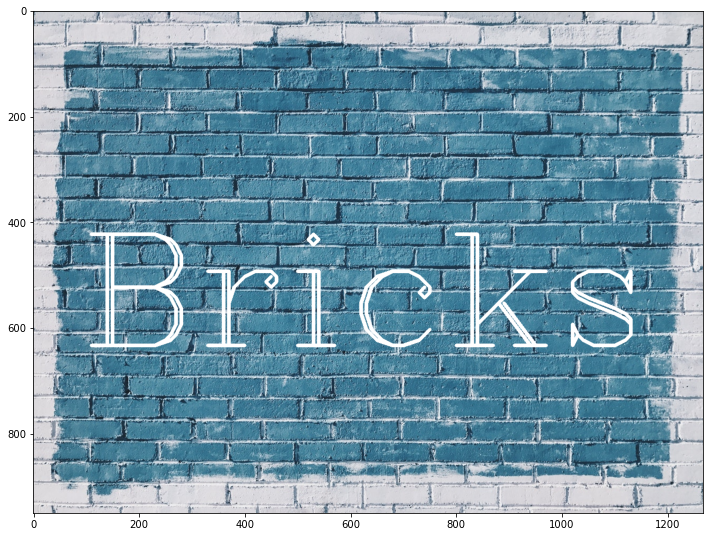

In [57]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
display_img(img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


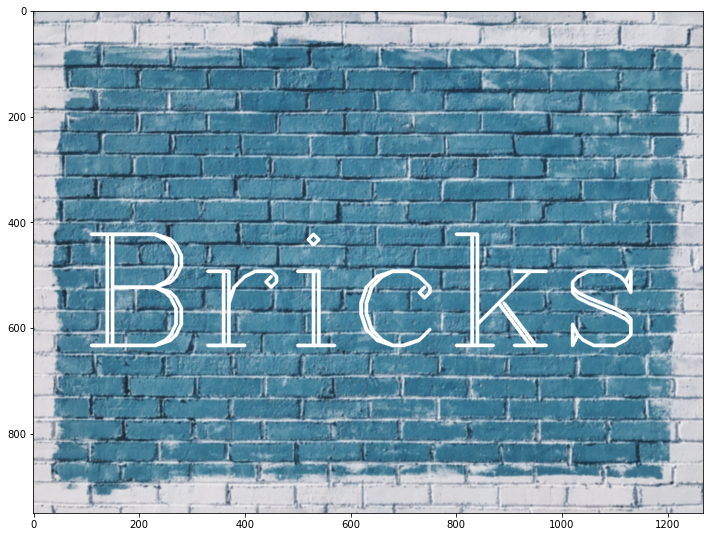

In [58]:
bltr_blur = cv2.bilateralFilter(img,5,50,50)
display_img(bltr_blur)
# as we can see there is no hue present between the font because of bilateral filtering

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


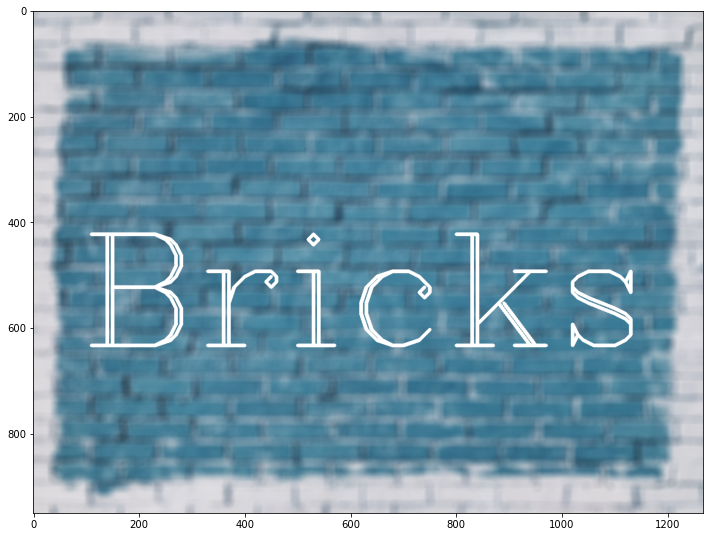

In [59]:
img = load_img()
cv2.putText(img,'Bricks',(90, 633),cv2.FONT_HERSHEY_COMPLEX,10,(250,200,150),5)
bltr_blur = cv2.bilateralFilter(img,20,100,100)
display_img(bltr_blur)